In [2]:
### System
import os
import joblib

### Mains
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import seaborn as sns
%matplotlib inline 

In [3]:
# df = pd.read_excel("data.csv.xlsx", sheet_name="train")
# df.to_pickle("data.pkl")

# source = "data_with_distance.pkl" # includes distance_customer_merchant from geopy.distance
# df = pd.read_pickle(source)

df = pd.read_csv("workspace-michael/train.csv")


# Enforce datatypes and fix UNIX time
def process_dataset(df):
    # Format dates
    df["transDate"] = pd.to_datetime(df["transDate"])
    df["dateOfBirth"] = pd.to_datetime(df["dateOfBirth"], format="%Y-%m-%d")
    df["unixTime"] = pd.to_datetime(df["unixTime"], unit="s")

    # Format categories
    df["business"] = df["business"].astype("category")
    df["category"] = df["category"].astype("category")
    df["gender"] = df["gender"].astype("category")
    df["city"] = df["city"].astype("category")
    df["state"] = df["state"].astype("category")
    df["job"] = df["job"].astype("category")

    # Format strings
    df["creditCardNum"] = df["creditCardNum"].astype(str)
    df["firstName"] = df["firstName"].astype(str)
    df["lastName"] = df["lastName"].astype(str)
    df["street"] = df["street"].astype(str)
    df["zip"] = df["zip"].astype(str)
    df["transNum"] = df["transNum"].astype(str)

    # Format bool
    df["isFraud"] = df["isFraud"].astype(bool)

    # Drop unix column
    df.drop(columns=["unixTime"], inplace=True)


process_dataset(df)

In [4]:
df.head()

,transDate,creditCardNum,business,category,amount,firstName,lastName,gender,street,city,...,zip,latitude,longitude,cityPop,job,dateOfBirth,transNum,merchLatitude,merchLongitude,isFraud
0,2019-01-01 04:28:00,4119762878330980,fraud_Welch Inc,misc_net,4.10,Melinda,Gutierrez,F,1497 West Gateway,Eureka,...,61530,40.7152,-89.2706,6713,Archivist,1945-08-19,3fc1791ff1db94ce9540262d7eb973e4,40.020043,-89.693412,False
1,2019-01-01 04:28:00,36078114201167,fraud_Auer-West,shopping_net,2.67,Christopher,Horn,M,956 Sanchez Highway,Mallie,...,41836,37.2692,-82.9161,798,Facilities manager,1926-06-26,edbf65b8606b53fc48168c2daa5933e5,37.622362,-82.676007,False
2,2019-01-01 04:29:00,4449530933957320,fraud_Balistreri-Nader,misc_pos,22.88,Felicia,Mckee,F,84079 Thomas Burgs,Tomales,...,94971,38.2427,-122.9145,337,Occupational psychologist,1954-07-05,2fcbde131cff833751dde53da54da6da,39.060101,-121.969417,False
3,2019-01-01 04:29:00,4302475216404890,"fraud_Boehm, Predovic and Reinger",misc_pos,9.59,Daniel,Cain,M,384 Newman Forks Apt. 370,Belmond,...,50421,42.8511,-93.6200,3032,Community pharmacist,1964-08-08,bcae564f9a1a299dfbd1efd917499968,43.280848,-94.340312,False
4,2019-01-01 04:32:00,377234009633447,fraud_Hudson-Ratke,grocery_pos,129.06,Theresa,Blackwell,F,43576 Kristina Islands,Shenandoah Junction,...,25442,39.3716,-77.8229,1925,Systems developer,1966-02-14,5e42e35c255edb55a192b3f1f0600936,39.211630,-78.409044,False


In [7]:
fraud_by_month[0]

KeyError: 0

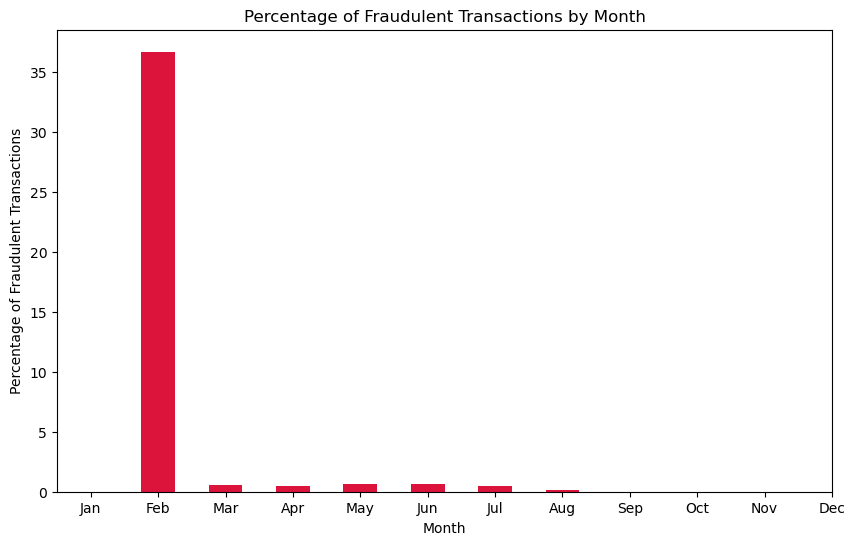

In [10]:
# Calculate the percentage of fraudulent transactions by month
fraud_by_month = (
    df.groupby([df["transDate"].dt.month, "isFraud"]).size().unstack(fill_value=0)
)
fraud_percent_by_month = (
    fraud_by_month[True] / (fraud_by_month[False] + fraud_by_month[True])
) * 100


# Plot
plt.grid(axis="y", linestyle="--", alpha=0.7)
fraud_percent_by_month.plot(kind="bar", figsize=(10, 6), color="crimson")
plt.title("Percentage of Fraudulent Transactions by Month")
plt.xlabel("Month")
plt.ylabel("Percentage of Fraudulent Transactions")
plt.xticks(
    ticks=range(12),
    labels=[
        "Jan",
        "Feb",
        "Mar",
        "Apr",
        "May",
        "Jun",
        "Jul",
        "Aug",
        "Sep",
        "Oct",
        "Nov",
        "Dec",
    ],
    rotation=0,
)
plt.show()

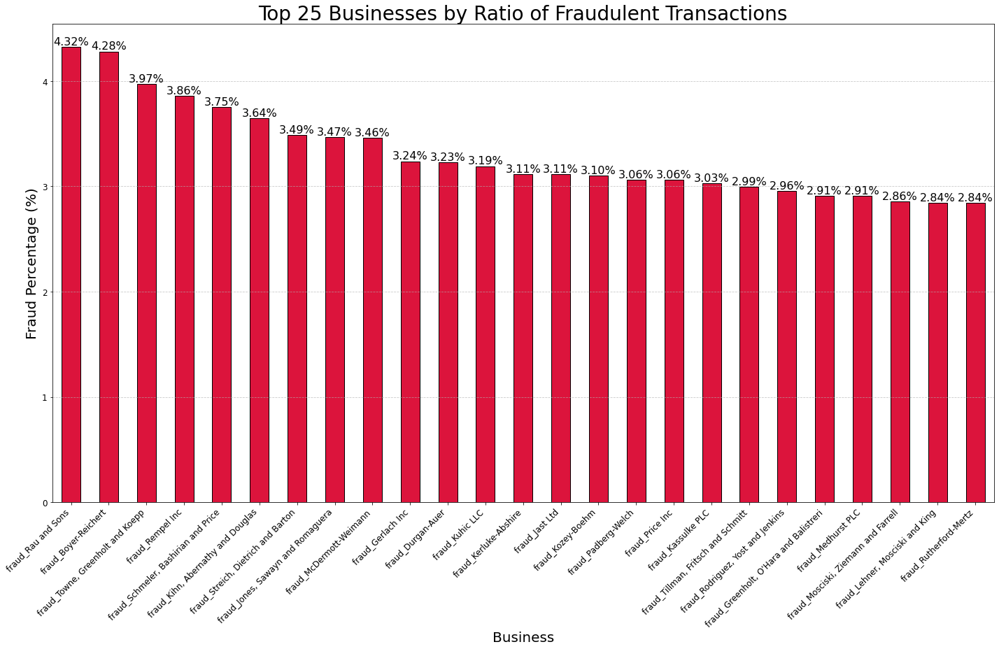

In [ ]:
# Group 'business' & 'isFraud'
fraud_counts_by_business = (
    df.groupby(["business", "isFraud"]).size().unstack(fill_value=0)
)

# Calculate the ratio of fraudulent transactions for each business
fraud_counts_by_business["FraudRatio"] = (
    fraud_counts_by_business[1]
    / (fraud_counts_by_business[0] + fraud_counts_by_business[1])
    * 100
)


# Sort the businesses by fraud ratio. Select top 25
sorted_businesses = fraud_counts_by_business.sort_values(
    "FraudRatio", ascending=False
).head(25)

plt.figure(figsize=(20, 13))
sorted_businesses["FraudRatio"].plot(
    kind="bar", color="crimson", fontsize=12, edgecolor="black"
)
plt.title("Top 25 Businesses by Ratio of Fraudulent Transactions", fontsize=28)
plt.xlabel("Business", fontsize=20)
plt.ylabel("Fraud Percentage (%)", fontsize=20)
plt.xticks(rotation=45, ha="right")
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()

# Annotate the bars with the percentage values
for index, value in enumerate(sorted_businesses["FraudRatio"]):
    plt.text(index, value, f"{value:.2f}%", ha="center", va="bottom", fontsize=16)

plt.show()

In [ ]:
#### Figure out violin plot

ValueError: min() arg is an empty sequence

<Figure size 720x432 with 0 Axes>

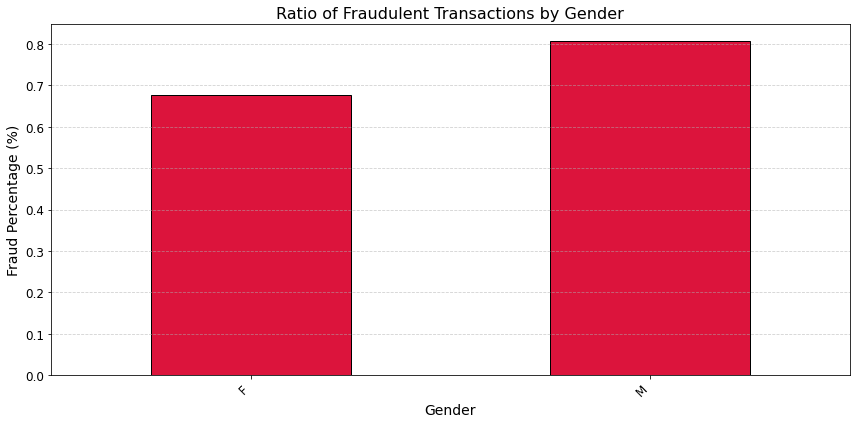

In [ ]:
# Ratio of Fradulent Transaction by Gender

fraud_counts_by_gender = df.groupby(["gender", "isFraud"]).size().unstack(fill_value=0)

# Calculate the ratio of fraudulent transactions for each business
fraud_counts_by_gender["FraudRatio"] = (
    fraud_counts_by_gender[1]
    / (fraud_counts_by_gender[0] + fraud_counts_by_gender[1])
    * 100
)

plt.figure(figsize=(12, 6))
fraud_counts_by_gender["FraudRatio"].plot(
    kind="bar", color="crimson", edgecolor="black"
)
plt.title("Ratio of Fraudulent Transactions by Gender", fontsize=16)
plt.xlabel("Gender", fontsize=14)
plt.ylabel("Fraud Percentage (%)", fontsize=14)
plt.xticks(
    rotation=45, ha="right", fontsize=12
)  # Rotate the x labels for better readability
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()  # Adjusts plot to ensure everything fits without overlapping
plt.show()

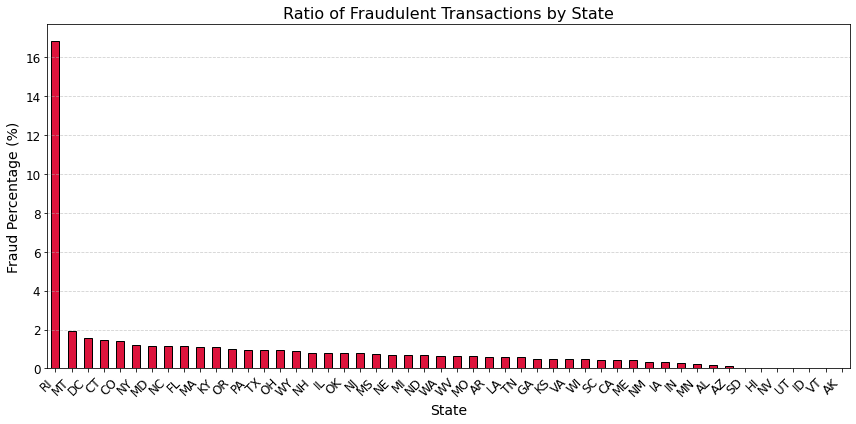

In [ ]:
# Ratio of Fradulent Transaction by State

fraud_counts_by_state = df.groupby(["state", "isFraud"]).size().unstack(fill_value=0)

# Calculate the ratio of fraudulent transactions for each business
fraud_counts_by_state["FraudRatio"] = (
    fraud_counts_by_state[1]
    / (fraud_counts_by_state[0] + fraud_counts_by_state[1])
    * 100
)

# Sort the businesses by fraud ratio and select the top 20
sorted_states = fraud_counts_by_state.sort_values("FraudRatio", ascending=False)

plt.figure(figsize=(12, 6))
sorted_states["FraudRatio"].plot(kind="bar", color="crimson", edgecolor="black")
plt.title("Ratio of Fraudulent Transactions by State", fontsize=16)
plt.xlabel("State", fontsize=14)
plt.ylabel("Fraud Percentage (%)", fontsize=14)
plt.xticks(
    rotation=45, ha="right", fontsize=12
)  # Rotate the x labels for better readability
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()  # Adjusts plot to ensure everything fits without overlapping
plt.show()

In [ ]:
# fraud_counts_by_state = fraud_counts_by_state.drop(0)
import plotly.graph_objects as go

fig = go.Figure(
    data=go.Choropleth(
        locations=fraud_counts_by_state.index,  # Spatial coordinates
        z=fraud_counts_by_state[1].astype(float),  # Data to be color-coded
        locationmode="USA-states",  # set of locations match entries in `locations`
        colorscale="Viridis",
        colorbar_title="Number of Fradulent Transactions",
    )
)

fig.update_layout(
    title_text="Total Fradulent Transactions Map",
    geo_scope="usa",  # limite map scope to USA
)

fig.show()

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(
    data=go.Choropleth(
        locations=fraud_counts_by_state.index,  # Spatial coordinates
        z=fraud_counts_by_state["FraudRatio"].astype(float),  # Data to be color-coded
        locationmode="USA-states",  # set of locations match entries in `locations`
        colorscale="Viridis",
        colorbar_title="Ratio of Fradulent Transaction",
        zmin=0.0,
        zmax=3.0,
    )
)

fig.update_layout(
    title_text="Total Fradulent Transactions Map",
    geo_scope="usa",  # limite map scope to USA
)

fig.show()

In [ ]:
import plotly.express as px

fig = px.density_mapbox(
    df,
    lat="merchLatitude",
    lon="merchLongitude",
    z="isFraud",
    radius=10,
    center=dict(lat=0, lon=180),
    zoom=9,
    mapbox_style="open-street-map",
)
fig.show()